In [269]:
import pandas as pd
import numpy as np
import time

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import matplotlib.pyplot as plt
import seaborn as sns

from lda_model import simple_cleaner

In [270]:
df1a = pd.read_csv('arxiv_datasets/cs.AI_1.csv')
df1b = pd.read_csv('arxiv_datasets/cs.AI_2.csv')
df2 = pd.read_csv('arxiv_datasets/cs.CC.csv')
df3 = pd.read_csv('arxiv_datasets/cs.CE.csv')
df4 = pd.read_csv('arxiv_datasets/cs.CG.csv')
df5 = pd.read_csv('arxiv_datasets/cs.CL.csv')
df6a = pd.read_csv('arxiv_datasets/cs.CV_1.csv')
df6b = pd.read_csv('arxiv_datasets/cs.CV_2.csv')
df7 = pd.read_csv('arxiv_datasets/cs.CY.csv')
df8 = pd.read_csv('arxiv_datasets/cs.DB.csv')
df9 = pd.read_csv('arxiv_datasets/cs.DC.csv')
df10 = pd.read_csv('arxiv_datasets/cs.DL.csv')
df11 = pd.read_csv('arxiv_datasets/cs.DS.csv')
df12 = pd.read_csv('arxiv_datasets/cs.ET.csv')
df13 = pd.read_csv('arxiv_datasets/cs.FL.csv')
df14 = pd.read_csv('arxiv_datasets/cs.GL.csv')
df15 = pd.read_csv('arxiv_datasets/cs.GR.csv')
df16 = pd.read_csv('arxiv_datasets/cs.GT.csv')
df17 = pd.read_csv('arxiv_datasets/cs.AR.csv')
df18 = pd.read_csv('arxiv_datasets/cs.HC.csv')
df19 = pd.read_csv('arxiv_datasets/cs.IR.csv')
df20 = pd.read_csv('arxiv_datasets/cs.IT.csv')
df21 = pd.read_csv('arxiv_datasets/cs.LO.csv')
df22a = pd.read_csv('arxiv_datasets/cs.LG_1.csv')
df22b = pd.read_csv('arxiv_datasets/cs.LG_2.csv')
df22c = pd.read_csv('arxiv_datasets/cs.LG_3.csv')
df23 = pd.read_csv('arxiv_datasets/cs.MA.csv')
df24 = pd.read_csv('arxiv_datasets/cs.MS.csv')
df25 = pd.read_csv('arxiv_datasets/cs.NI.csv')
df26 = pd.read_csv('arxiv_datasets/cs.NE.csv')
df27 = pd.read_csv('arxiv_datasets/cs.NA.csv')
df28 = pd.read_csv('arxiv_datasets/cs.OS.csv')
df29 = pd.read_csv('arxiv_datasets/cs.PF.csv')
df30 = pd.read_csv('arxiv_datasets/cs.PL.csv')
df31 = pd.read_csv('arxiv_datasets/cs.RO.csv')
df32 = pd.read_csv('arxiv_datasets/cs.SI.csv')
df33 = pd.read_csv('arxiv_datasets/cs.SD.csv')
df34 = pd.read_csv('arxiv_datasets/cs.SE.csv')
df35 = pd.read_csv('arxiv_datasets/cs.SC.csv')
df36 = pd.read_csv('arxiv_datasets/cs.SY.csv')
df37 = pd.read_csv('arxiv_datasets/cs.CR.csv')
df38 = pd.read_csv('arxiv_datasets/cs.DM.csv')

In [271]:
df = pd.concat([df1a,df1b,df2,df3,df4,df5,df6a,df6b,df7,df8,df9,df10,
                df11,df12,df13,df14,df15,df16,df17,df18,df19,df20,
                df21,df22a,df22b,df22c,df23,df24,df25,df26,df27,df28,df29,df30,
                df31,df32,df33,df34,df35,df36,df37,df38]).reset_index(drop=True)

In [272]:
df = df.drop_duplicates().reset_index(drop=True)[['Title','Published','Summary']]
df.shape

(582340, 3)

In [6]:
start_time = time.time()
df['cleaned_text'] = df['Summary'].apply(simple_cleaner)
print(time.time()-start_time)

df.head(2)

93.78759980201721


,Title,Published,Summary,cleaned_text
0,Domain-Independent Dynamic Programming,2024-01-25T01:48:09Z,"For combinatorial optimization problems, mod...",combinatorial optimization problem modelbased ...
1,Agent-based Simulation with Netlogo to Evaluat...,2024-01-25T13:05:06Z,In this paper an agent-based simulation is d...,paper agentbased simulation developed order ev...


In [284]:
from nltk.stem import WordNetLemmatizer

In [288]:
lemmatizer = WordNetLemmatizer()

lemmatizer.lemmatize('tries')

'try'

In [289]:
import inflect

In [290]:
p = inflect.engine()

my_text = "Hello world or worlds this is a test or tests to check functionality functionalities"
def singular_maker(text):
    return " ".join([p.singular_noun(word) or word for word in text])

singular_maker(my_text.split())

'Hello world or world thi i a test or test to check functionality functionality'

In [ ]:
p.singular_noun('datasets')

In [ ]:
df['pub_date'] = pd.to_datetime(df['Published']).dt.date #convert object to datetime

date_df = pd.DataFrame(df.groupby('pub_date')['cleaned_text'].sum()).reset_index() #group by date and concatenate strings
date_df['cleaned_text'] = date_df['cleaned_text'].str.split().apply(singular_maker)
date_df['number_of_papers'] = [num for num in df.groupby('pub_date')['cleaned_text'].count()] #count the number of papers per day
date_df['number_of_tokens'] = date_df['cleaned_text'].str.split().apply(len) #count number of tokens per day
date_df['unique_tokens'] = date_df['cleaned_text'].str.split().apply(set).apply(len)

print(time.time()-start_time)

print(f"Total tokens in dataset: {date_df['cleaned_text'].apply(len).sum()}")
date_df

In [273]:
date_df = pd.read_csv('lemmatized_date_df.csv')

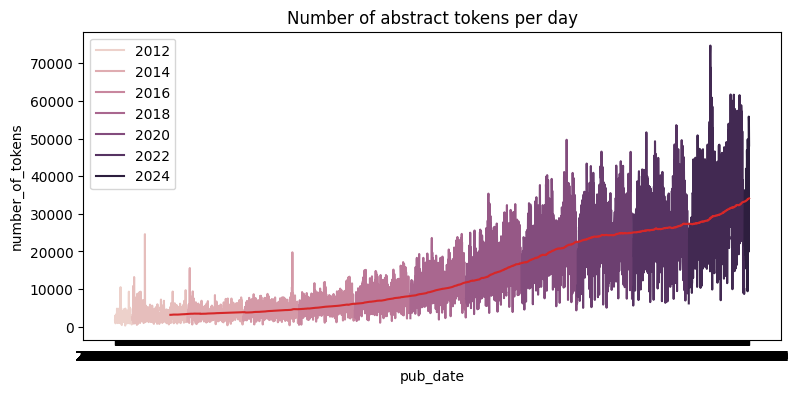

In [274]:
plt.figure(figsize=(9,4))
sns.lineplot(y=date_df['number_of_tokens'], x=date_df['pub_date'], hue=pd.to_datetime(date_df['pub_date']).dt.year)
sns.lineplot(y=date_df['number_of_tokens'].rolling(360).mean(), x=date_df['pub_date'])
plt.title('Number of abstract tokens per day');

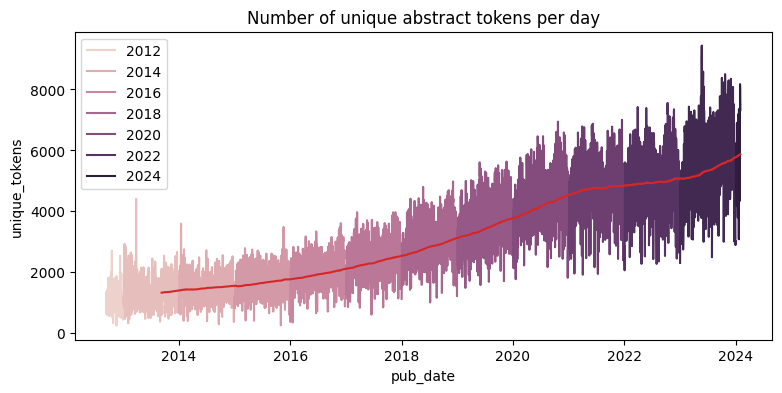

In [39]:
plt.figure(figsize=(9,4))
sns.lineplot(y=date_df['unique_tokens'], x=date_df['pub_date'], hue=pd.to_datetime(date_df['pub_date']).dt.year)
sns.lineplot(y=date_df['unique_tokens'].rolling(360).mean(), x=date_df['pub_date'])
plt.title('Number of unique abstract tokens per day');

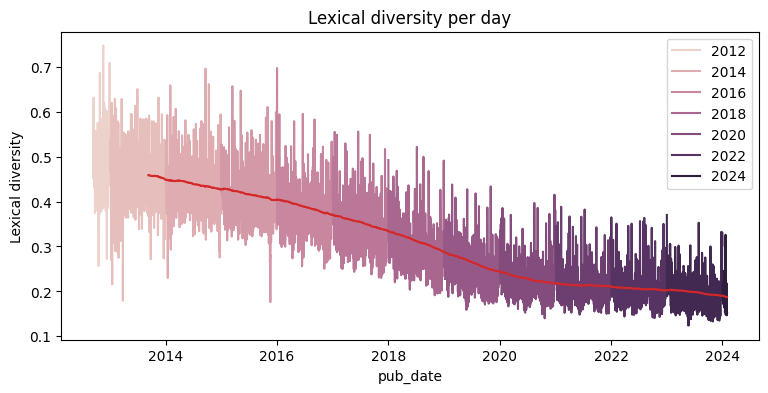

In [40]:
plt.figure(figsize=(9,4))
sns.lineplot(y=date_df['unique_tokens'] / date_df['number_of_tokens'], x=date_df['pub_date'], hue=pd.to_datetime(date_df['pub_date']).dt.year)
sns.lineplot(y=(date_df['unique_tokens'] / date_df['number_of_tokens']).rolling(360).mean(), x=date_df['pub_date'])
plt.ylabel("Lexical diversity")
plt.title('Lexical diversity per day');

<Axes: xlabel='number_of_papers', ylabel='number_of_tokens'>

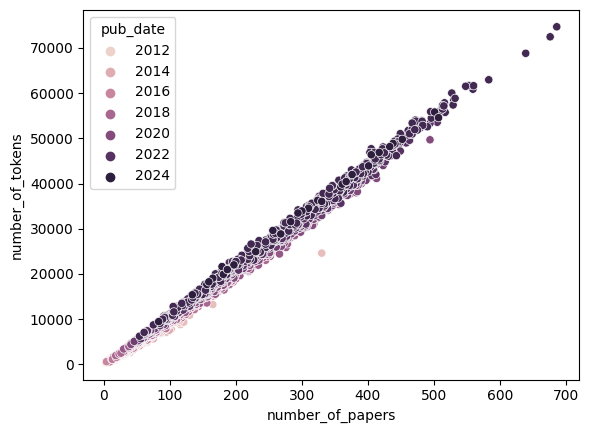

In [41]:
sns.scatterplot(x=date_df['number_of_papers'], y=date_df['number_of_tokens'],hue=pd.to_datetime(date_df['pub_date']).dt.year)

<Axes: ylabel='pub_date'>

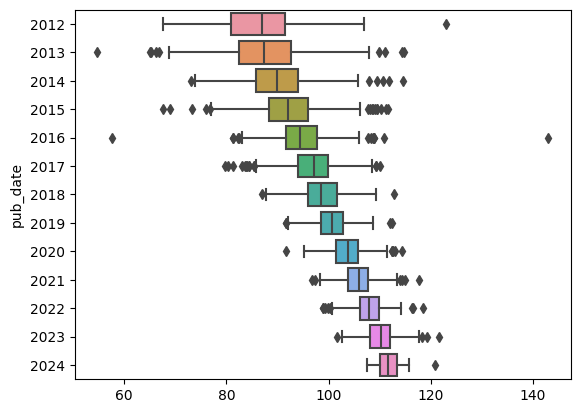

In [42]:
sns.boxplot(x=date_df['number_of_tokens'] / date_df['number_of_papers'],y=(pd.to_datetime(date_df['pub_date']).dt.year).astype('category'))


<Axes: ylabel='Count'>

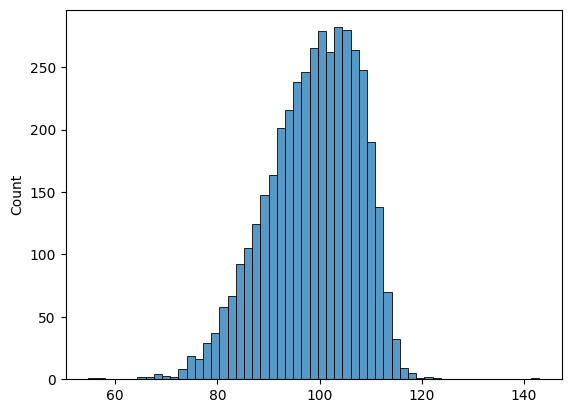

In [43]:
sns.histplot(date_df['number_of_tokens'] / date_df['number_of_papers'])

### Creating Word Vectors

In [275]:
from sklearn.feature_extraction.text import CountVectorizer
from collections import Counter

In [276]:
start_time = time.time()
#### turn the text strings into token vectors
#### but only if a token appears in at least 500 documents 
count_text_vectorizer = CountVectorizer(min_df=500, ngram_range=(1,2))
count_text_vectors = count_text_vectorizer.fit_transform(date_df['cleaned_text'])

print(time.time()-start_time)

print(f"Shape: {count_text_vectors.shape}\n")
count_text_vectorizer.get_feature_names_out()

60.033421993255615
Shape: (4112, 9684)



array(['01', '05', '10', ..., 'zeroshot learning', 'zerosum', 'zone'],
      dtype=object)

In [277]:
date_df = pd.concat([date_df,pd.DataFrame(count_text_vectors.toarray(), columns=count_text_vectorizer.get_feature_names_out())],axis=1)

print(time.time()-start_time)

60.39392685890198


In [278]:
date_df

,pub_date,cleaned_text,number_of_papers,number_of_tokens,unique_tokens,01,05,10,100,1000,...,yield better,yielded,yielding,young,youtube,zero,zeroshot,zeroshot learning,zerosum,zone
0,2012-09-12,backpropagation algorithm one widely used popu...,18,1678,940,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
1,2012-09-13,theory random real number exceedingly welldeve...,12,1170,647,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2012-09-14,automatic text summarization preprocessing imp...,32,2969,1350,0,0,0,1,0,...,0,0,0,0,0,4,0,0,0,0
3,2012-09-15,several variant constraint satisfaction proble...,21,1766,822,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,2012-09-16,present framework largescale distributed escie...,10,931,588,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4107,2024-01-27,diffusion planning recognized effective decisi...,181,19891,4333,0,0,6,1,0,...,0,2,1,0,0,0,2,0,0,1
4108,2024-01-28,predicting next activity ongoing proces one co...,187,20943,4537,0,1,3,1,0,...,0,0,2,0,0,0,4,2,0,0
4109,2024-01-29,answering complex logical query incomplete kno...,501,55825,8173,0,0,11,3,5,...,1,0,3,1,5,6,14,0,0,0
4110,2024-01-30,difficulty one key driver player engagement of...,507,54576,8034,0,0,9,7,0,...,2,0,6,0,7,5,23,3,0,8


In [47]:
#plt.figure(figsize=(9,4))
#token_list = ['llm', 'recurrent', 'optimize', 'optimal', 'cnn', 'rnn', 'neighbor',
#             'architecture', 'lstm', 'transfer', 'transformer', 'quantum', 'learn', #'language',
#             'large', 'cpu', 'gpu', 'nvidia', 'intel', 'cryptocurrency','chatgpt', 'turing']
#for i in token_list:
#    sns.lineplot(x=date_df['pub_date'], y=(date_df[i] / date_df['number_of_papers']).rolling(360).mean() / date_df[i].max(), alpha=0.7)
##plt.title('Use of the word "neural"')
##plt.axhline(3, ls='--')
##plt.legend(token_list)

In [48]:
def common_token_counter(clean_string):
    return [j for j,k in Counter(clean_string.split()).most_common(50)]

In [49]:
top_tokens_list = Counter(" ".join([i for i in date_df['cleaned_text'].apply(common_token_counter).str.join(sep=' ')]).split())

print(f"Number of total tokens: {len(top_tokens_list)}")

Number of total tokens: 3457


In [55]:
drop_list = ['pub_date','cleaned_text','number_of_papers','number_of_tokens','unique_tokens']
date_df.drop(columns=drop_list).sum().sort_values(ascending=False)[0:1000].index

Index(['model', 'method', 'datum', 'network', 'learning', 'algorithm',
       'problem', 'system', 'result', 'approach',
       ...
       'topology', 'bounded', 'static', 'circuit', 'transition', 'employed',
       'integration', 'around', 'simulated', 'assessment'],
      dtype='object', length=1000)

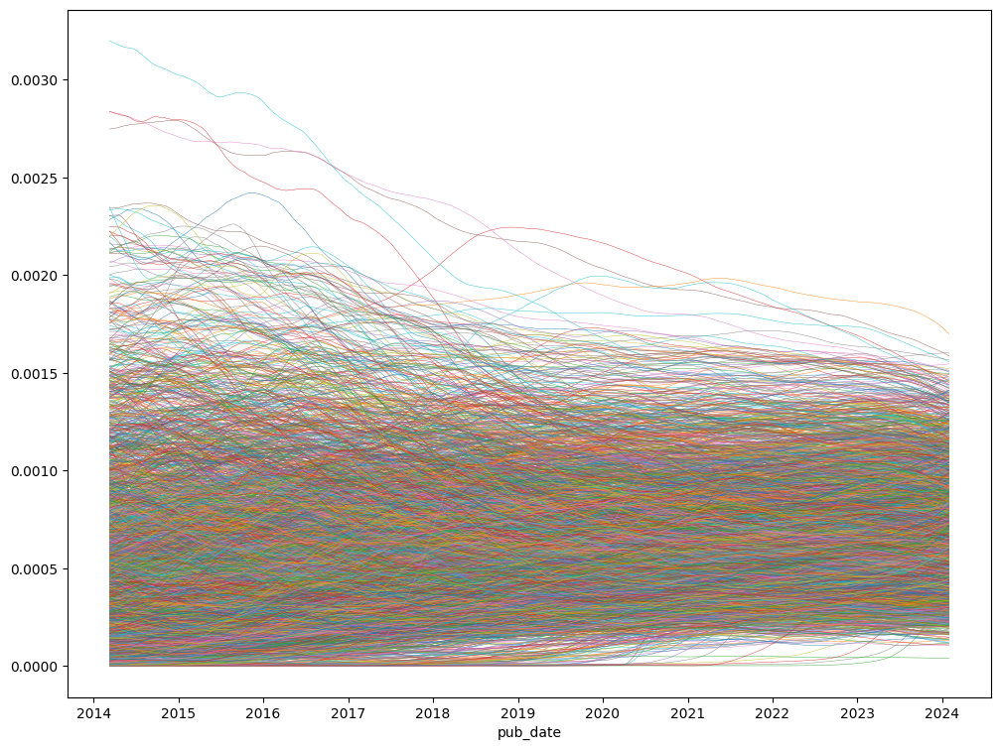

In [57]:
plt.figure(figsize=(12,9))
token_list = date_df.drop(columns=drop_list).sum().sort_values(ascending=False)[0:3000].index

for i in token_list:
    try:
#        sns.lineplot(x=date_df['pub_date'], y=(date_df[i] / date_df['number_of_papers']).rolling(360).mean()*100, alpha=0.3)
        sns.lineplot(x=date_df['pub_date'], y=(date_df[i] / date_df['number_of_papers'] / date_df[i].max()).rolling(360).mean().rolling(180).mean(), linewidth=0.3,)
    except:
        pass

In [58]:
drop_list = ['pub_date','cleaned_text','number_of_papers','number_of_tokens','unique_tokens']


df_dict = {}
for col in date_df.drop(columns=drop_list).columns:
    df_dict[col] = (date_df[col] / date_df['number_of_papers']).rolling(360).mean().rolling(180).mean() / date_df[col].max()

moving_avg_df = pd.concat([date_df['pub_date'], pd.DataFrame(df_dict)], axis=1)[538:].reset_index(drop=True)
moving_avg_df = moving_avg_df.rename(columns={'pub_date': 'ds'})

In [59]:
moving_avg_df

,ds,01,05,10,100,1000,10000,11,12,13,...,yield better,yielded,yielding,young,youtube,zero,zeroshot,zeroshot learning,zerosum,zone
0,2014-03-10,0.000345,0.000161,0.000478,0.000411,0.000236,0.000111,0.000297,0.000480,0.000355,...,0.000103,0.000120,0.000306,0.000172,0.000209,0.000730,0.000002,0.000008,0.000156,0.000252
1,2014-03-11,0.000345,0.000161,0.000478,0.000411,0.000236,0.000111,0.000297,0.000480,0.000356,...,0.000103,0.000120,0.000306,0.000172,0.000209,0.000730,0.000002,0.000008,0.000156,0.000252
2,2014-03-12,0.000345,0.000161,0.000478,0.000411,0.000236,0.000111,0.000297,0.000480,0.000356,...,0.000104,0.000120,0.000306,0.000172,0.000209,0.000730,0.000002,0.000008,0.000156,0.000252
3,2014-03-13,0.000345,0.000161,0.000479,0.000411,0.000236,0.000111,0.000298,0.000480,0.000357,...,0.000104,0.000120,0.000306,0.000172,0.000209,0.000731,0.000002,0.000008,0.000156,0.000252
4,2014-03-14,0.000345,0.000161,0.000479,0.000411,0.000236,0.000111,0.000298,0.000480,0.000358,...,0.000104,0.000120,0.000306,0.000172,0.000210,0.000731,0.000002,0.000009,0.000156,0.000252
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3569,2024-01-27,0.000210,0.000253,0.000935,0.000632,0.000338,0.000233,0.000588,0.000737,0.000629,...,0.000225,0.000348,0.000595,0.000189,0.000218,0.000545,0.000410,0.000233,0.000176,0.000225
3570,2024-01-28,0.000210,0.000253,0.000935,0.000633,0.000338,0.000233,0.000588,0.000737,0.000630,...,0.000225,0.000349,0.000596,0.000189,0.000218,0.000545,0.000411,0.000234,0.000176,0.000225
3571,2024-01-29,0.000210,0.000253,0.000935,0.000633,0.000338,0.000233,0.000588,0.000737,0.000630,...,0.000225,0.000349,0.000597,0.000189,0.000218,0.000545,0.000412,0.000234,0.000176,0.000225
3572,2024-01-30,0.000209,0.000253,0.000935,0.000633,0.000338,0.000233,0.000588,0.000737,0.000630,...,0.000225,0.000349,0.000598,0.000189,0.000218,0.000545,0.000412,0.000234,0.000176,0.000224


In [7]:
#date_df.to_csv('lemmatized_date_df.csv', index=False)
#moving_avg_df.to_csv('lemmatized_moving_avg_df.csv', index=False)

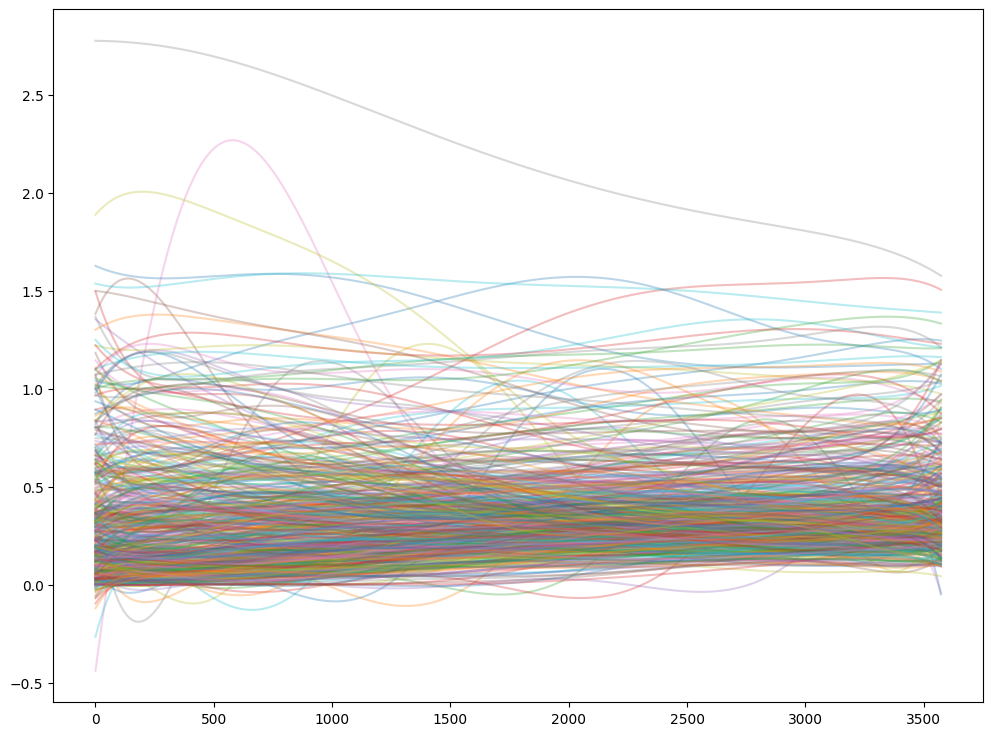

In [61]:
#https://stackoverflow.com/questions/45143450/how-to-fit-polynomial-to-a-time-series-data-in-python
plt.figure(figsize=(12,9))
x = [i for i in range(len(moving_avg_df))]

for word in moving_avg_df.drop(columns=['ds']).columns[:500]:
    y = moving_avg_df[word]
    
    curve = np.polyfit(x,y*1000, deg=7)
    #print(curve)
    p = np.poly1d( curve )
    sns.lineplot(x=x,y= p(x), alpha=0.3)

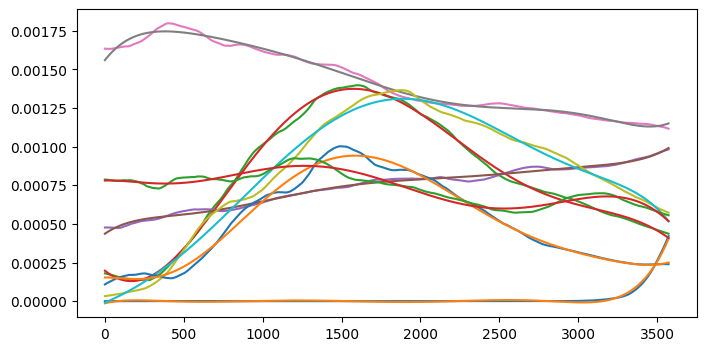

In [103]:
plt.figure(figsize=(8,4))
x = [i for i in range(len(moving_avg_df))]

for word in ['llm', 'recurrent', 'optimize', 'optimal', 'cnn', 'rnn', 'neighbor',
#             'architecture', 'lstm', 'transfer', 'transformer', 'quantum', 'learn', #'language',
             ]:
    y = moving_avg_df[word]
    curve = np.polyfit(x,y, deg=7)
    #print(curve)
    p = np.poly1d( curve )
    plt.plot(x,y,p(x))

In [67]:
plt.figure(figsize=(12,9))
x = [i for i in range(len(moving_avg_df))]
polynomial_dict = {}

for word in moving_avg_df.drop(columns=['ds']).columns:
    y = moving_avg_df[word]*1000
    polynomial_dict[word] = np.polyfit(x,y, deg=7)

<Figure size 1200x900 with 0 Axes>

In [122]:
polynomial_df = pd.DataFrame(polynomial_dict).T.reset_index().rename(columns = {'index':'token', 0:'deg7', 1:'deg6', 2:'deg5', 3:'deg4',
                                                 4:'deg3', 5:'deg2', 6:'deg1', 7:'y_int'})

<Axes: xlabel='y_int', ylabel='Count'>

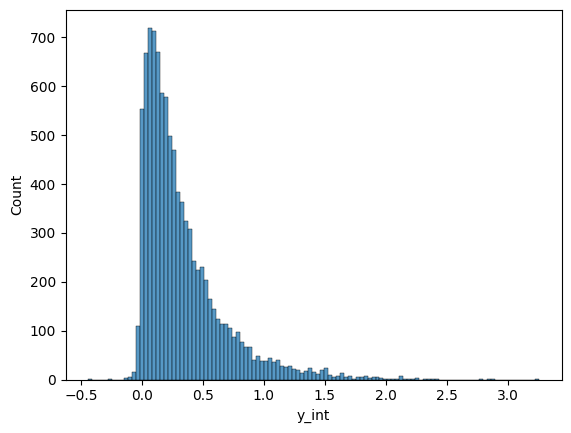

In [123]:
sns.histplot(polynomial_df['y_int'])

In [124]:
polynomial_df

,token,deg7,deg6,deg5,deg4,deg3,deg2,deg1,y_int
0,01,-1.095447e-24,1.730777e-20,-1.015676e-16,2.808659e-13,-3.732806e-10,2.153878e-07,-0.000095,0.341473
1,05,-2.036596e-23,2.543806e-19,-1.245908e-15,3.026300e-12,-3.816095e-09,2.418983e-06,-0.000653,0.178645
2,10,-3.074824e-24,3.123383e-20,-1.100835e-16,1.320472e-13,6.803105e-11,-2.599019e-07,0.000316,0.476851
3,100,1.063806e-23,-1.310134e-19,6.283717e-16,-1.454710e-12,1.589479e-09,-5.908481e-07,-0.000021,0.427614
4,1000,1.721089e-24,-3.276357e-21,-1.118983e-16,7.301364e-13,-1.775758e-09,1.830570e-06,-0.000598,0.270629
...,...,...,...,...,...,...,...,...,...
9679,zero,2.831435e-23,-3.806790e-19,2.048190e-15,-5.622029e-12,8.301346e-09,-6.329433e-06,0.001998,0.692198
9680,zeroshot,1.038878e-24,-1.677580e-20,1.052018e-16,-3.212303e-13,5.092859e-10,-4.070595e-07,0.000181,-0.010842
9681,zeroshot learning,-2.335746e-23,2.877227e-19,-1.392222e-15,3.325238e-12,-4.001078e-09,2.103617e-06,-0.000111,-0.005625
9682,zerosum,-2.578449e-23,3.338001e-19,-1.704229e-15,4.329449e-12,-5.653169e-09,3.488475e-06,-0.000768,0.209295


In [140]:
len(polynomial_df['positive_slope'])

9684

### KNeighbors Clustering based on polynomial curves

In [125]:
polynomial_df['positive_slope'] = polynomial_df['deg1'] > 0

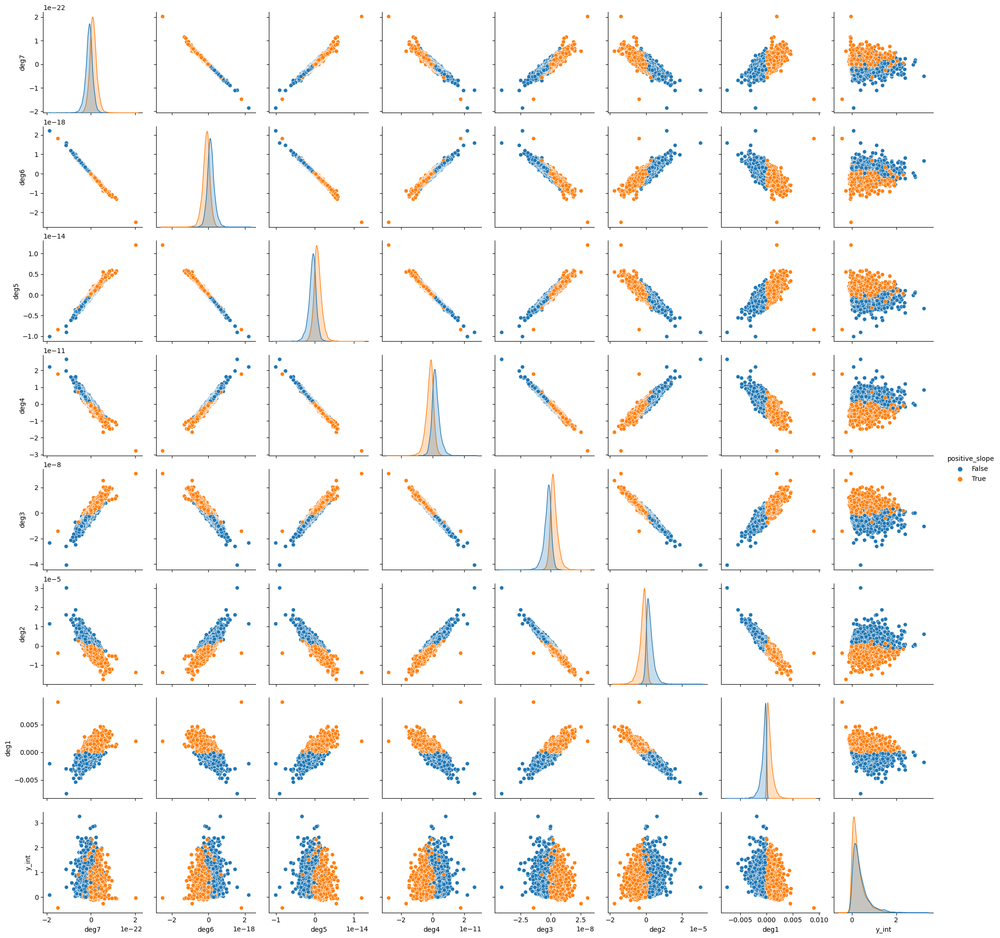

In [126]:
sns.pairplot(polynomial_df, hue='positive_slope')

### KMeans Clustering

In [116]:
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, RobustScaler, QuantileTransformer, MaxAbsScaler, PowerTransformer, Normalizer

In [191]:
X = polynomial_df.drop(columns=['token', 'positive_slope'])

sc = QuantileTransformer()
X_sc = sc.fit_transform(X)
pd.DataFrame(X_sc, columns = X.columns)

,deg7,deg6,deg5,deg4,deg3,deg2,deg1,y_int,cluster
0,0.457506,0.550087,0.444449,0.560115,0.438072,0.553194,0.411058,0.650080,0.196196
1,0.112797,0.884979,0.124566,0.865078,0.148849,0.838220,0.163622,0.412212,0.765766
2,0.411559,0.578249,0.441165,0.537319,0.489239,0.475056,0.648480,0.768196,0.196196
3,0.721470,0.286401,0.704224,0.311904,0.650954,0.419919,0.458277,0.732719,0.467968
4,0.529107,0.509358,0.440454,0.625781,0.296302,0.783004,0.180166,0.563898,0.196196
...,...,...,...,...,...,...,...,...,...
9679,0.933419,0.057945,0.951290,0.039273,0.969960,0.022137,0.981000,0.876635,0.669169
9680,0.509951,0.482665,0.521367,0.469461,0.538604,0.448446,0.575587,0.017052,0.467968
9681,0.086187,0.906965,0.100568,0.883377,0.138570,0.807726,0.401629,0.023675,0.765766
9682,0.069072,0.932487,0.066592,0.931547,0.073815,0.908101,0.133973,0.469369,0.765766


In [192]:
1 / np.log(np.abs(X)) * np.sign(X)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/pandas/core/internals/blocks.py:366: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


,deg7,deg6,deg5,deg4,deg3,deg2,deg1,y_int,cluster
0,0.018126,-0.021977,0.027155,-0.034601,0.046065,-0.065143,0.107968,-0.930678,inf
1,0.019139,-0.023356,0.029138,-0.037702,0.051589,-0.077327,0.136363,-0.580601,0.621335
2,0.018471,-0.022265,0.027214,-0.033720,-0.042715,0.065950,-0.124068,-1.350344,inf
3,-0.018904,0.023000,-0.028569,0.036689,-0.049359,0.069727,0.092995,-1.177115,1.442695
4,-0.018275,0.021201,0.027226,-0.035784,0.049630,-0.075695,0.134726,-0.765108,inf
...,...,...,...,...,...,...,...,...,...
9679,-0.019261,0.023578,-0.029567,0.038604,-0.053744,0.083540,-0.160887,-2.718252,0.721348
9680,-0.018108,0.021961,-0.027181,0.034763,-0.046733,0.067961,-0.116050,0.221027,1.442695
9681,0.019190,-0.023423,0.029233,-0.037837,0.051715,-0.076500,0.109861,0.193031,0.621335
9682,0.019226,-0.023505,0.029407,-0.038218,0.052656,-0.079580,0.139436,-0.639383,0.621335


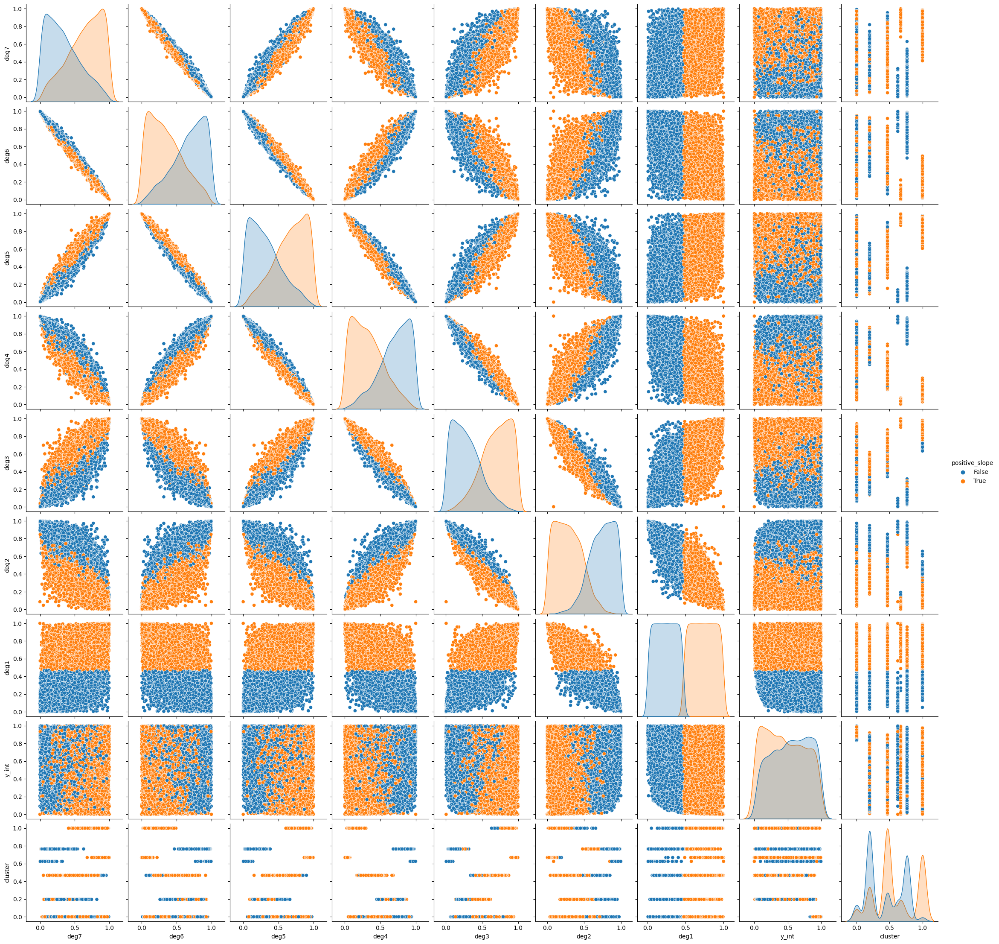

In [193]:
sns.pairplot(pd.concat([pd.DataFrame(X_sc, columns = X.columns), polynomial_df['positive_slope']], axis=1), hue='positive_slope')

In [196]:
k_clusters = KMeans(n_clusters=7,)

k_clusters.fit(X_sc)

KMeans(n_clusters=7)

In [197]:
k_clusters.labels_

array([1, 3, 1, ..., 3, 3, 2], dtype=int32)

In [198]:
polynomial_df['cluster'] = k_clusters.labels_

In [199]:
polynomial_df

,token,deg7,deg6,deg5,deg4,deg3,deg2,deg1,y_int,positive_slope,cluster
0,01,-1.095447e-24,1.730777e-20,-1.015676e-16,2.808659e-13,-3.732806e-10,2.153878e-07,-0.000095,0.341473,False,1
1,05,-2.036596e-23,2.543806e-19,-1.245908e-15,3.026300e-12,-3.816095e-09,2.418983e-06,-0.000653,0.178645,False,3
2,10,-3.074824e-24,3.123383e-20,-1.100835e-16,1.320472e-13,6.803105e-11,-2.599019e-07,0.000316,0.476851,True,1
3,100,1.063806e-23,-1.310134e-19,6.283717e-16,-1.454710e-12,1.589479e-09,-5.908481e-07,-0.000021,0.427614,False,4
4,1000,1.721089e-24,-3.276357e-21,-1.118983e-16,7.301364e-13,-1.775758e-09,1.830570e-06,-0.000598,0.270629,False,1
...,...,...,...,...,...,...,...,...,...,...,...
9679,zero,2.831435e-23,-3.806790e-19,2.048190e-15,-5.622029e-12,8.301346e-09,-6.329433e-06,0.001998,0.692198,True,6
9680,zeroshot,1.038878e-24,-1.677580e-20,1.052018e-16,-3.212303e-13,5.092859e-10,-4.070595e-07,0.000181,-0.010842,True,2
9681,zeroshot learning,-2.335746e-23,2.877227e-19,-1.392222e-15,3.325238e-12,-4.001078e-09,2.103617e-06,-0.000111,-0.005625,False,3
9682,zerosum,-2.578449e-23,3.338001e-19,-1.704229e-15,4.329449e-12,-5.653169e-09,3.488475e-06,-0.000768,0.209295,False,3


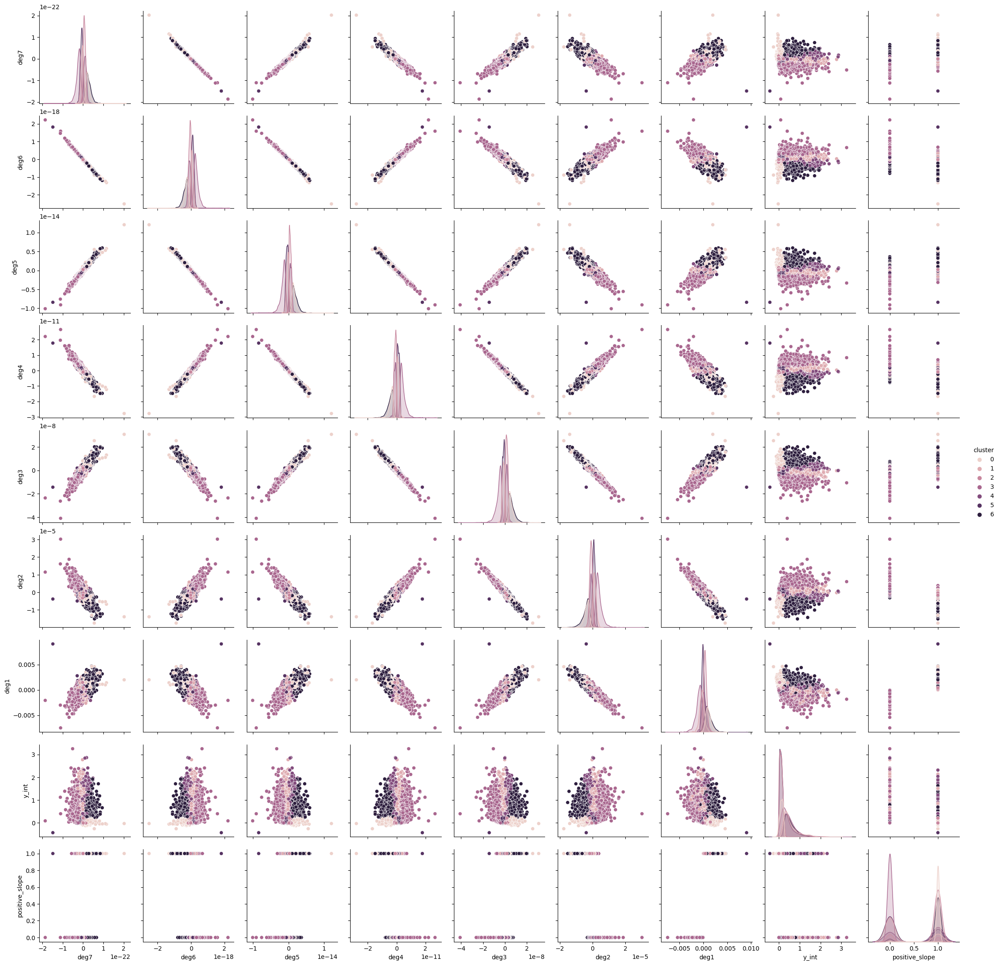

In [200]:
#plt.figure(figsize=(32,32))
sns.pairplot(polynomial_df.drop(columns=['token']), hue='cluster')
#plt.savefig("clustered_pairplot2.png")

In [161]:
cluster_dict = {}
for i in range(len(neighbors_df)):
    cluster_dict[neighbors_df['unique_id'][i]] = neighbors_df['cluster'][i]

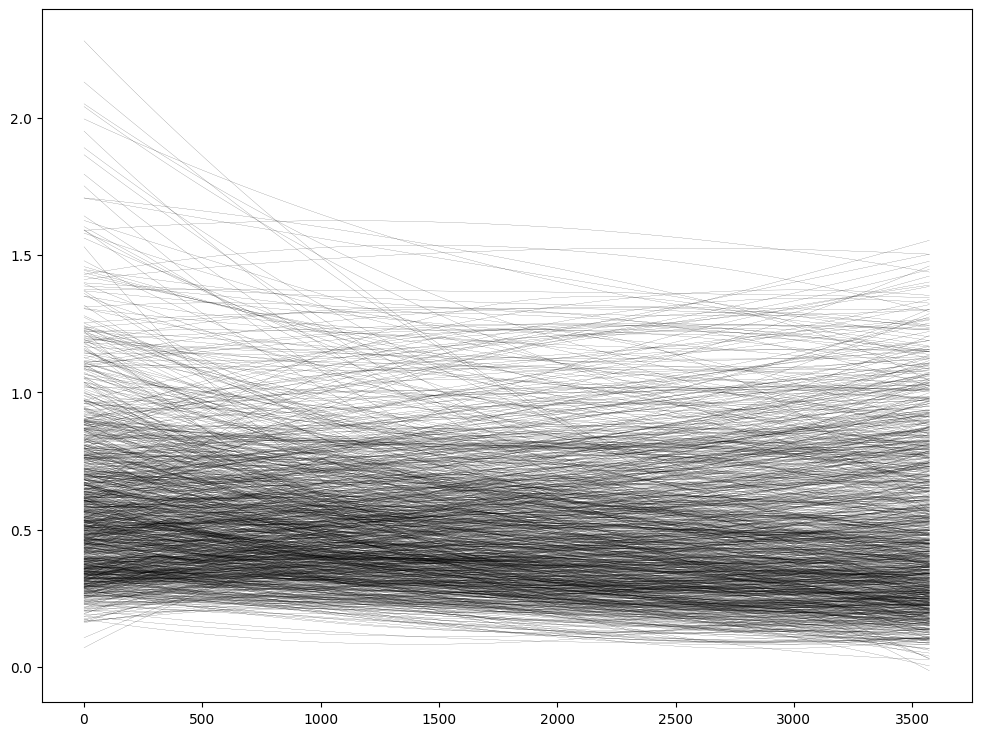

In [211]:
#temp_df = polynomial_df[polynomial_df['cluster']==0][['deg7','deg6','deg5','deg4','deg3','deg2','deg1','y_int']].reset_index(drop=True)
plt.figure(figsize=(12,9))
x = [i for i in range(len(moving_avg_df))]

for word in polynomial_df[polynomial_df['cluster']==6]['token']:
    y = moving_avg_df[word]
    
    curve = np.polyfit(x,y*1000, deg=2)
    p = np.poly1d( curve )
    sns.lineplot(x=x,y= p(x), linewidth=0.1, color='black')


In [235]:
integral_dict = {}

In [269]:
%%time

#for token in moving_avg_df.drop(columns=['ds']).columns[7000:]:
#    integral_dict[token] = [sum(np.abs(moving_avg_df[token] - moving_avg_df[word])) for word in moving_avg_df.drop(columns=['ds']).columns]


CPU times: user 58min 58s, sys: 46.5 s, total: 59min 45s
Wall time: 59min 54s


In [199]:
limited_df = moving_avg_df[:-392]

In [216]:
%%time
#limited_integral_dict = {}
for token in moving_avg_df.drop(columns=['ds']).columns[8000:]:
    limited_integral_dict[token] = [sum(np.abs(limited_df[token] - limited_df[word])) for word in limited_df.drop(columns=['ds']).columns]


CPU times: user 34min 9s, sys: 25.9 s, total: 34min 35s
Wall time: 39min 45s


In [217]:
pd.DataFrame(limited_integral_dict).to_csv('limited_integral_df.csv', index=False)

In [269]:
%%time

#for token in moving_avg_df.drop(columns=['ds']).columns[0:10]:
#    limited_integral_dict[token] = [sum(np.abs(moving_avg_df[token] - moving_avg_df[word])) for word in moving_avg_df.drop(columns=['ds']).columns]


CPU times: user 58min 58s, sys: 46.5 s, total: 59min 45s
Wall time: 59min 54s


In [9]:
#pd.DataFrame(integral_dict).to_csv('integral_dict.csv', index=False)

In [219]:
#integral_df = pd.DataFrame(integral_dict)
limited_integral_df = pd.read_csv('limited_integral_df.csv')
integral_df = pd.read_csv('integral_dict.csv')
moving_avg_df = pd.read_csv('lemmatized_moving_avg_df.csv')

limited_integral_df

,01,05,10,100,1000,10000,11,12,13,14,...,yield better,yielded,yielding,young,youtube,zero,zeroshot,zeroshot learning,zerosum,zone
0,0.000000,0.290574,1.504632,0.771788,0.278304,0.187450,0.546860,1.099829,0.649511,0.463248,...,0.214470,0.301722,0.749918,0.237876,0.113652,1.390259,0.593197,0.328774,0.229301,0.204302
1,0.290574,0.000000,1.726979,0.994135,0.368818,0.231807,0.765881,1.322176,0.871858,0.677160,...,0.203121,0.201124,0.964166,0.232814,0.226580,1.612606,0.354990,0.163522,0.171459,0.136139
2,1.504632,1.726979,0.000000,0.732844,1.358161,1.511604,0.961098,0.446625,0.855121,1.049819,...,1.535910,1.544737,0.762813,1.737423,1.569088,0.672975,2.080007,1.703310,1.723416,1.687940
3,0.771788,0.994135,0.732844,0.000000,0.625317,0.778760,0.262742,0.328041,0.199715,0.319037,...,0.803066,0.811893,0.150622,1.004579,0.836244,0.621555,1.347163,0.970466,0.990572,0.955096
4,0.278304,0.368818,1.358161,0.625317,0.000000,0.179736,0.407271,0.953358,0.503040,0.326130,...,0.213148,0.196663,0.595348,0.379262,0.272943,1.243788,0.721846,0.348031,0.365255,0.335230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9679,1.390259,1.612606,0.672975,0.621555,1.243788,1.397231,0.846725,0.402200,0.746386,0.935446,...,1.421537,1.430364,0.648440,1.623050,1.454715,0.000000,1.965634,1.588937,1.609043,1.573567
9680,0.593197,0.354990,2.080007,1.347163,0.721846,0.570508,1.118908,1.675204,1.224886,1.030187,...,0.544096,0.535269,1.317193,0.358552,0.522223,1.965634,0.000000,0.376697,0.390300,0.405104
9681,0.328774,0.163522,1.703310,0.970466,0.348031,0.245554,0.742211,1.298507,0.848189,0.653490,...,0.205128,0.199453,0.940496,0.274791,0.286561,1.588937,0.376697,0.000000,0.230254,0.197801
9682,0.229301,0.171459,1.723416,0.990572,0.365255,0.229606,0.762317,1.318613,0.868295,0.673596,...,0.229158,0.303814,0.960603,0.093489,0.165436,1.609043,0.390300,0.230254,0.000000,0.151878


In [11]:
from sklearn.cluster import KMeans

In [220]:
X = limited_integral_df

k_cluster_model = KMeans(n_clusters=50)
k_cluster_model.fit(X)

limited_integral_df['original_tokens'] = limited_integral_df.columns
limited_integral_df['k_cluster'] = k_cluster_model.labels_

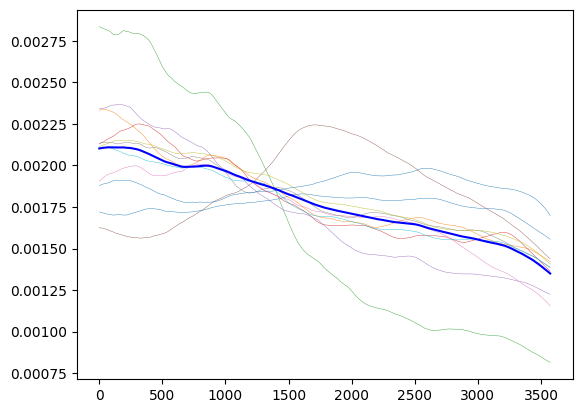

['based', 'case', 'channel', 'consider', 'known', 'network', 'order', 'particular', 'problem', 'set', 'used']


In [264]:
cluster_num = 35
#print([i for i in integral_df[integral_df['k_cluster']==cluster_num]['original_tokens']])
moving_avg_df[limited_integral_df[limited_integral_df['k_cluster']==cluster_num]['original_tokens']].plot.line(legend=False, linewidth=0.3)#, ylim=(0,.003))
moving_avg_df[limited_integral_df[limited_integral_df['k_cluster']==cluster_num]['original_tokens']].mean(axis=1).plot.line(color='blue', linestyle='-')#ylim=(0,.003))
plt.show()
print([i for i in limited_integral_df[limited_integral_df['k_cluster']==cluster_num]['original_tokens']])

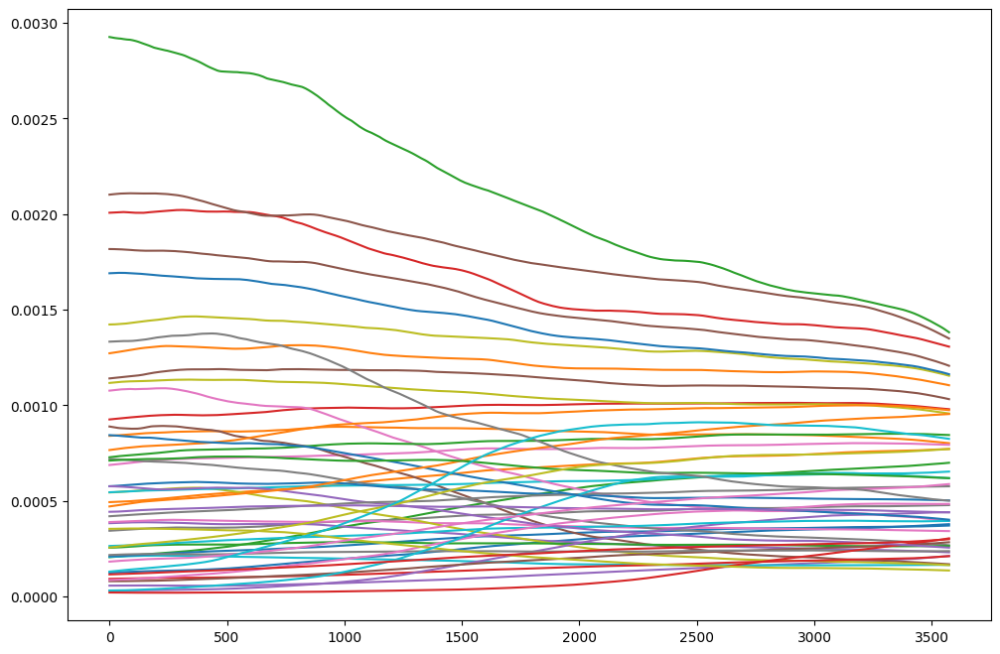

In [241]:
plt.figure(figsize=(12,8))
for i in range(0,50):
    moving_avg_df[limited_integral_df[limited_integral_df['k_cluster']==i]['original_tokens']].mean(axis=1).plot.line()

In [119]:
#!pip install yellowbrick

In [301]:
from yellowbrick.cluster import KElbowVisualizer, InterclusterDistance, SilhouetteVisualizer

CPU times: user 1h 9min 58s, sys: 3min 9s, total: 1h 13min 8s
Wall time: 10min 9s


KElbowVisualizer(ax=<Axes: >, estimator=KMeans(n_clusters=19), k=(2, 20))

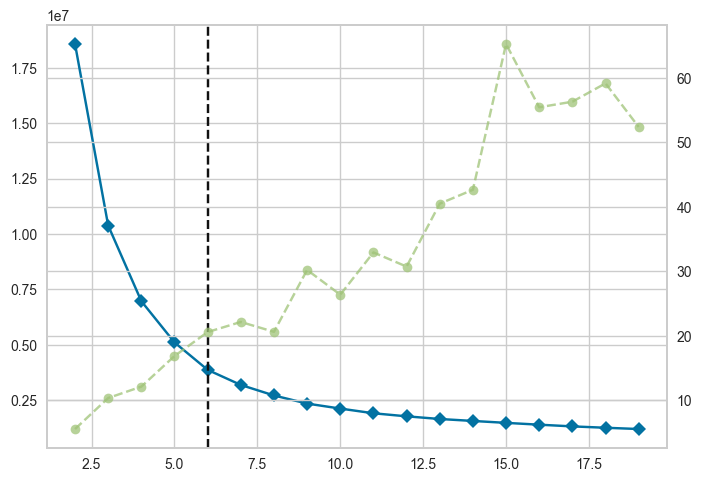

In [289]:
%%time
visualization = KElbowVisualizer(estimator=k_cluster_model,k=(2,20))

visualization.fit(X)

In [291]:
visualization.show()

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
intercluster_vis = InterclusterDistance(KMeans(25))
intercluster_vis.fit(X)

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/yellowbrick/style/colors.py:104: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colormap = cm.get_cmap(colormap)


SilhouetteVisualizer(ax=<Axes: >, estimator=KMeans(n_clusters=20))

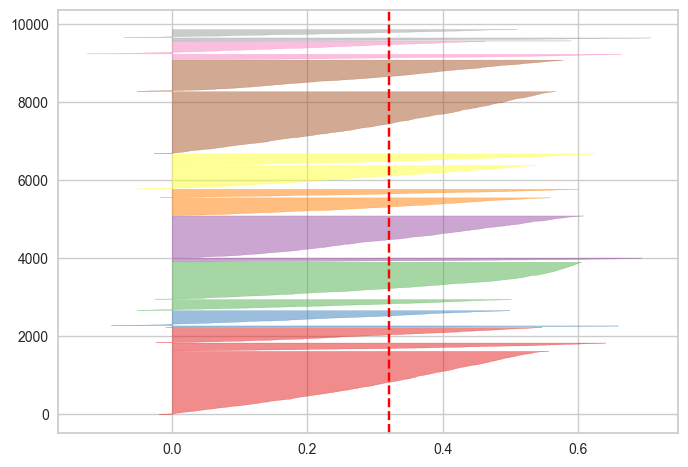

In [303]:
silhouette_vis = SilhouetteVisualizer(KMeans(20))

silhouette_vis.fit(X)

In [262]:
#integral_df.to_csv('integral_cluster_all_data.csv')
limited_integral_df.to_csv('integral_cluster_limited_data.csv')

In [282]:
limited_integral_df['original_tokens'] =  limited_integral_df['original_tokens'].str.replace(' ','.')
limited_integral_df[['original_tokens','k_cluster']].to_csv('limited_integral_cluster_labels.csv', index=False)

In [283]:
limited_integral_df['original_tokens']

0                      01
1                      05
2                      10
3                     100
4                    1000
              ...        
9679                 zero
9680             zeroshot
9681    zeroshot.learning
9682              zerosum
9683                 zone
Name: original_tokens, Length: 9684, dtype: object